In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from keras import optimizers
from sklearn.metrics import mean_squared_error

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [4]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [5]:
def plot_curve(history):
    print('Last train loss: %s'%history.history['loss'][-1])
    print('Last validation loss: %s'%history.history['val_loss'][-1])
    
    # loss curves
    plt.figure(figsize=[8,6])

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(loss) + 1)

    # Plot loss
    plt.plot(epochs, loss, 'c--', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [6]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [7]:
cloud_cover = preparedata('../succeed-prophet/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


# Train/Test Model ,lags = 20

In [8]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,20)

X_train Shape : (14748, 20, 1)
y_train Shape : (14748, 1)
X_test Shape :  (293, 20, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [9]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### Add frist layer: units = 50

In [10]:
test1 = test.copy()

In [11]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 12s 19ms/step - loss: 0.0124 - accuracy: 0.0085 - val_loss: 0.0062 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0042 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0034 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 7s 16ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.002

Last train loss: 0.0012072836980223656
Last validation loss: 0.0018324475968256593
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


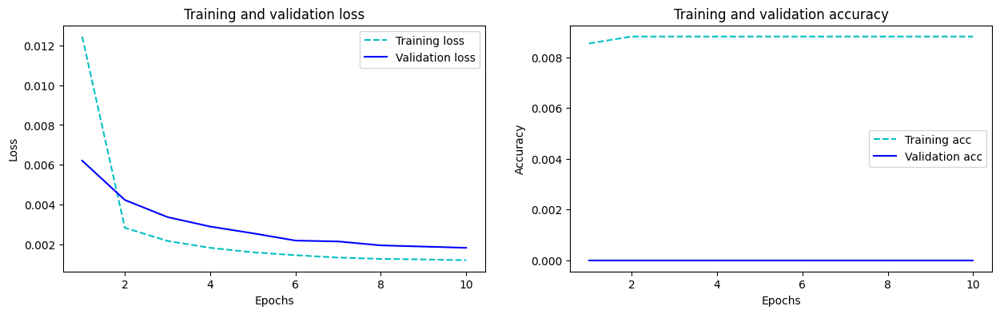

In [12]:
plot_curve(hist_adam)

In [13]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.324595
1,2021-12-16 09:11:00,0.112,0.144608
2,2021-12-16 09:12:00,0.116,0.112641
3,2021-12-16 09:13:00,0.112,0.118715
4,2021-12-16 09:14:00,0.099,0.118448
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951
289,2021-12-16 13:59:00,0.169,0.167558
290,2021-12-16 14:00:00,0.147,0.168295
291,2021-12-16 14:01:00,0.145,0.151338


In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [15]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0018232967597486634

In [26]:
mse_data = pd.DataFrame(columns=['Model' ,'LSTM lag20'])
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 adam', lstm_mse_error_unit_50_adam]
mse_data

,Model,LSTM lag20
0,Lstm mse error unit 50 adam,0.001823


----------------------------------------------------------------------------------

## optimizer sgd

### Add frist layer: units = 50

In [16]:
model_50_sgd = Sequential()
model_50_sgd.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_sgd.add(Dense(units = 1))
model_50_sgd.compile(optimizer = 'sgd', loss = 'mean_squared_error')
hist_50_sgd = model_50_sgd.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 11s 12ms/step - loss: 0.0214 - accuracy: 0.0083 - val_loss: 0.0067 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0034 - accuracy: 0.0088 - val_loss: 0.0064 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0033 - accuracy: 0.0088 - val_loss: 0.0062 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0032 - accuracy: 0.0088 - val_loss: 0.0059 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0031 - accuracy: 0.0088 - val_loss: 0.0058 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0030 - accuracy: 0.0088 - val_loss: 0.0056 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0055 - v

Last train loss: 0.002704153535887599
Last validation loss: 0.005105907563120127
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


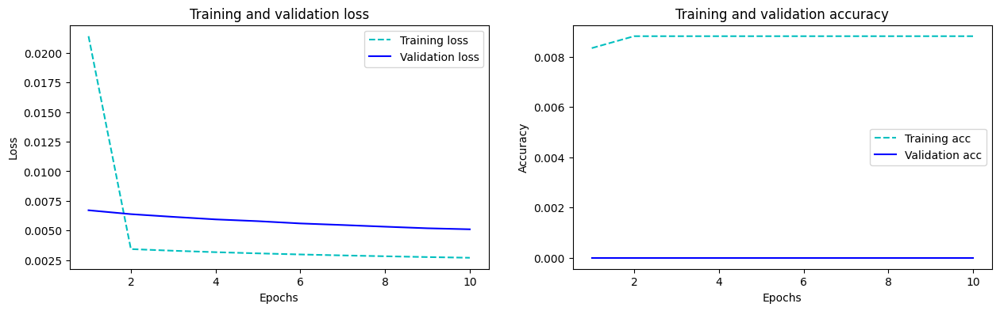

In [17]:
plot_curve(hist_50_sgd)

In [18]:
predict_scaled_50_sgd = model_50_sgd.predict(X_test)
predict_50_sgd = sc.inverse_transform(predict_scaled_50_sgd)
test1['LSTM_50_sgd'] = predict_50_sgd
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd
0,2021-12-16 09:10:00,0.111,0.324595,0.306350
1,2021-12-16 09:11:00,0.112,0.144608,0.264963
2,2021-12-16 09:12:00,0.116,0.112641,0.233833
3,2021-12-16 09:13:00,0.112,0.118715,0.210409
4,2021-12-16 09:14:00,0.099,0.118448,0.191142
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.174025
289,2021-12-16 13:59:00,0.169,0.167558,0.173229
290,2021-12-16 14:00:00,0.147,0.168295,0.172807
291,2021-12-16 14:01:00,0.145,0.151338,0.167783


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_sgd'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [20]:
lstm_mse_error_unit_50_sgd = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_sgd'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_sgd)

Better MSE value is :  0.0018232967597486634


,Model,MSE error
0,model,0.001823
1,model_1,0.005080


In [27]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 sgd', lstm_mse_error_unit_50_sgd]

----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 7s 9ms/step - loss: 0.0047 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 3s 7ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 3s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val

Last train loss: 0.0012202825164422393
Last validation loss: 0.001834074966609478
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


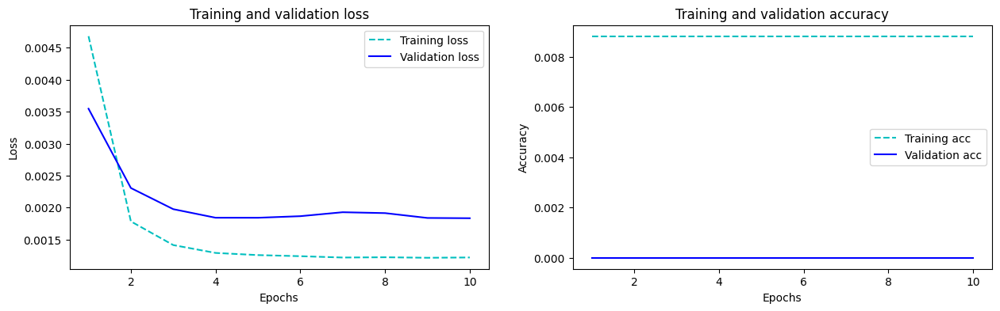

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.324595,0.306350,0.327249
1,2021-12-16 09:11:00,0.112,0.144608,0.264963,0.127544
2,2021-12-16 09:12:00,0.116,0.112641,0.233833,0.113625
3,2021-12-16 09:13:00,0.112,0.118715,0.210409,0.116542
4,2021-12-16 09:14:00,0.099,0.118448,0.191142,0.113750
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.174025,0.167757
289,2021-12-16 13:59:00,0.169,0.167558,0.173229,0.167610
290,2021-12-16 14:00:00,0.147,0.168295,0.172807,0.168501
291,2021-12-16 14:01:00,0.145,0.151338,0.167783,0.148415


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0018232967597486634


,Model,MSE error
0,model,0.001823
1,model_1,0.001825


In [28]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 rmsprop', lstm_mse_error_unit_50_rms]

In [29]:
mse_data

,Model,LSTM lag20
0,Lstm mse error unit 50 adam,0.001823
1,Lstm mse error unit 50 sgd,0.005080
2,Lstm mse error unit 50 rmsprop,0.001825


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [30]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 7s 15ms/step - loss: 0.0085 - accuracy: 0.0086 - val_loss: 0.0054 - val_accuracy: 0.0000e+00
Epoch 2/10
231/231 [==============================] - 3s 12ms/step - loss: 0.0026 - accuracy: 0.0088 - val_loss: 0.0042 - val_accuracy: 0.0000e+00
Epoch 3/10
231/231 [==============================] - 3s 11ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 4/10
231/231 [==============================] - 3s 12ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 5/10
231/231 [==============================] - 3s 12ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 6/10
231/231 [==============================] - 3s 12ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 7/10
231/231 [==============================] - 3s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.002

Last train loss: 0.0012106453068554401
Last validation loss: 0.0018702393863350153
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


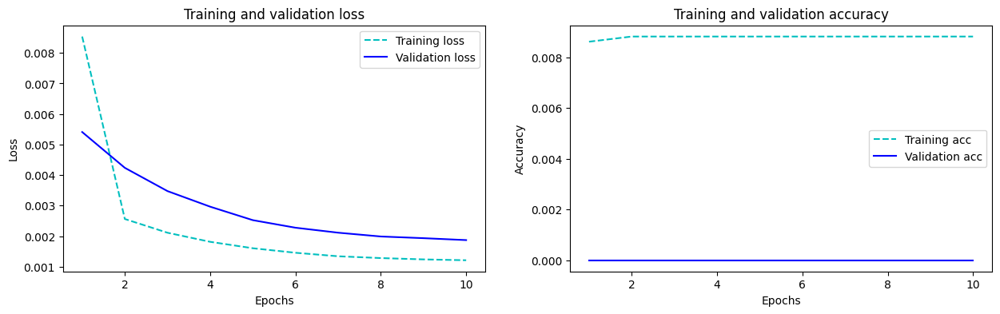

In [31]:
plot_curve(hist_batch_size64)

In [32]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.324595,0.306350,0.327249,0.327283
1,2021-12-16 09:11:00,0.112,0.144608,0.264963,0.127544,0.160626
2,2021-12-16 09:12:00,0.116,0.112641,0.233833,0.113625,0.117410
3,2021-12-16 09:13:00,0.112,0.118715,0.210409,0.116542,0.116729
4,2021-12-16 09:14:00,0.099,0.118448,0.191142,0.113750,0.117709
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.174025,0.167757,0.169480
289,2021-12-16 13:59:00,0.169,0.167558,0.173229,0.167610,0.169040
290,2021-12-16 14:00:00,0.147,0.168295,0.172807,0.168501,0.169613
291,2021-12-16 14:01:00,0.145,0.151338,0.167783,0.148415,0.154284


In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [34]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.0018232967597486634


,Model,MSE error
0,model,0.001823
1,model_1,0.001861


In [35]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 batch_size64', lstm_mse_error_batch_size64]

---

### learning rate 0.1

In [36]:
test2 = test.copy()

#### Add frist layer: units = 50

In [37]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 14ms/step - loss: 0.0486 - accuracy: 0.0085 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0030 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0033 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.002

Last train loss: 0.0015279734507203102
Last validation loss: 0.0019620819948613644
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


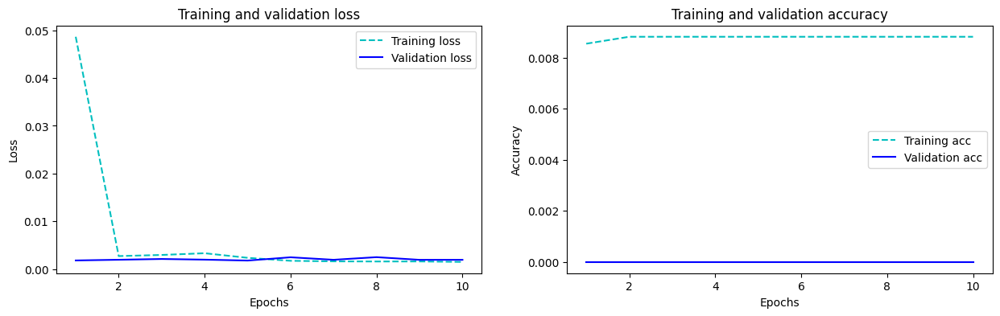

In [38]:
plot_curve(hist_01)

In [39]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.310132
1,2021-12-16 09:11:00,0.112,0.068434
2,2021-12-16 09:12:00,0.116,0.109056
3,2021-12-16 09:13:00,0.112,0.100929
4,2021-12-16 09:14:00,0.099,0.099845
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.155647
289,2021-12-16 13:59:00,0.169,0.156058
290,2021-12-16 14:00:00,0.147,0.157085
291,2021-12-16 14:01:00,0.145,0.132085


In [40]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [41]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0018232967597486634


,Model,MSE error
0,model,0.001823
1,model_1,0.001952


In [62]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.1', lstm_mse_error_unit_50_01]
mse_data

,Model,LSTM lag20
0,Lstm mse error unit 50 adam,0.001823
1,Lstm mse error unit 50 sgd,0.005080
2,Lstm mse error unit 50 rmsprop,0.001825
3,Lstm mse error adam 50 batch_size64,0.001861
4,Lstm mse error adam 50 learning rate 0.1,0.001952


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [42]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 7s 10ms/step - loss: 0.0153 - accuracy: 0.0087 - val_loss: 0.0027 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 10ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019

Last train loss: 0.0013753864914178848
Last validation loss: 0.0018962977919727564
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


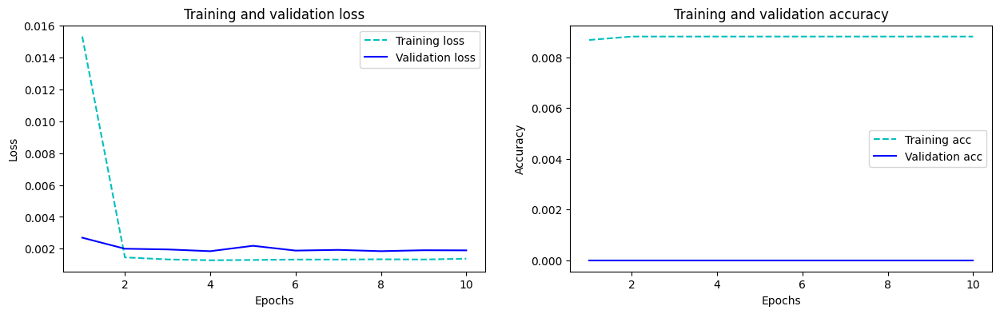

In [43]:
plot_curve(hist_005)

In [44]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.310132,0.333104
1,2021-12-16 09:11:00,0.112,0.068434,0.150461
2,2021-12-16 09:12:00,0.116,0.109056,0.103085
3,2021-12-16 09:13:00,0.112,0.100929,0.107974
4,2021-12-16 09:14:00,0.099,0.099845,0.120021
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.155647,0.168688
289,2021-12-16 13:59:00,0.169,0.156058,0.168092
290,2021-12-16 14:00:00,0.147,0.157085,0.169122
291,2021-12-16 14:01:00,0.145,0.132085,0.151164


In [45]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [46]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0018232967597486634


,Model,MSE error
0,model,0.001823
1,model_1,0.001887


In [63]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.05', lstm_mse_error_unit_50_005]

----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [47]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 7s 9ms/step - loss: 0.0036 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 12s 27ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 

Last train loss: 0.0012248120037838817
Last validation loss: 0.0020959163084626198
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


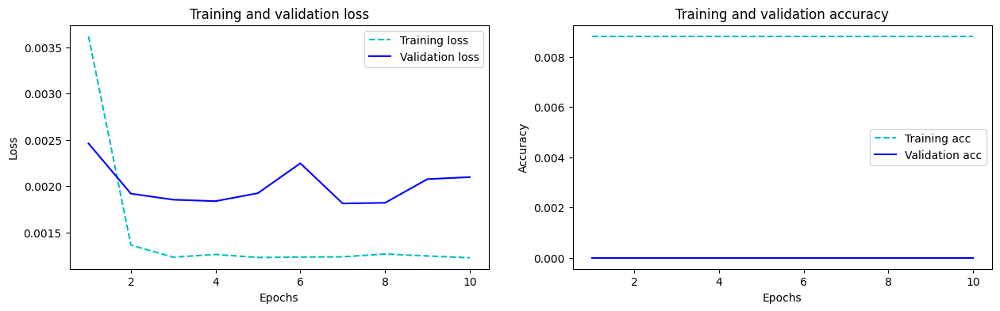

In [48]:
plot_curve(hist_001)

In [49]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.310132,0.333104,0.342493
1,2021-12-16 09:11:00,0.112,0.068434,0.150461,0.142577
2,2021-12-16 09:12:00,0.116,0.109056,0.103085,0.124252
3,2021-12-16 09:13:00,0.112,0.100929,0.107974,0.131603
4,2021-12-16 09:14:00,0.099,0.099845,0.120021,0.131076
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.155647,0.168688,0.184776
289,2021-12-16 13:59:00,0.169,0.156058,0.168092,0.184609
290,2021-12-16 14:00:00,0.147,0.157085,0.169122,0.185530
291,2021-12-16 14:01:00,0.145,0.132085,0.151164,0.165169


In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [51]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0018232967597486634


,Model,MSE error
0,model,0.001823
1,model_1,0.002085


In [64]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.01', lstm_mse_error_001]

----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [52]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 15ms/step - loss: 0.0054 - accuracy: 0.0088 - val_loss: 0.0034 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 10ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0012110009556636214
Last validation loss: 0.0018211863934993744
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


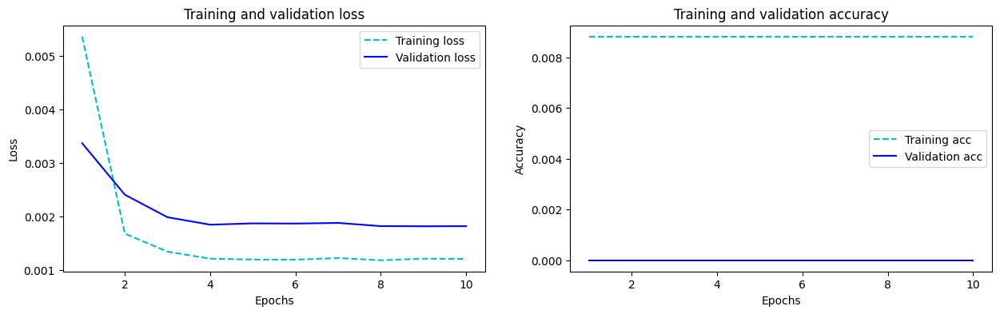

In [53]:
plot_curve(hist_0005)

In [54]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.310132,0.333104,0.342493,0.322830
1,2021-12-16 09:11:00,0.112,0.068434,0.150461,0.142577,0.130661
2,2021-12-16 09:12:00,0.116,0.109056,0.103085,0.124252,0.132001
3,2021-12-16 09:13:00,0.112,0.100929,0.107974,0.131603,0.126422
4,2021-12-16 09:14:00,0.099,0.099845,0.120021,0.131076,0.118569
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.155647,0.168688,0.184776,0.169106
289,2021-12-16 13:59:00,0.169,0.156058,0.168092,0.184609,0.169120
290,2021-12-16 14:00:00,0.147,0.157085,0.169122,0.185530,0.169921
291,2021-12-16 14:01:00,0.145,0.132085,0.151164,0.165169,0.150340


In [55]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [56]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001823
1,model_1,0.001812


In [65]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.005', lstm_mse_error_unit_50_0005]

----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [57]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 7s 9ms/step - loss: 0.0085 - accuracy: 0.0085 - val_loss: 0.0051 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0039 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 4s 8ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0020 - val

Last train loss: 0.0011656369315460324
Last validation loss: 0.0018390144687145948
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


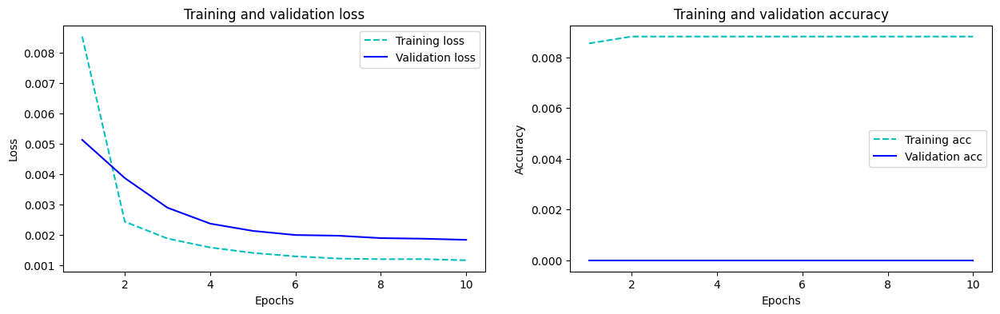

In [58]:
plot_curve(hist_0001)

In [59]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.310132,0.333104,0.342493,0.322830,0.342493
1,2021-12-16 09:11:00,0.112,0.068434,0.150461,0.142577,0.130661,0.142577
2,2021-12-16 09:12:00,0.116,0.109056,0.103085,0.124252,0.132001,0.124252
3,2021-12-16 09:13:00,0.112,0.100929,0.107974,0.131603,0.126422,0.131603
4,2021-12-16 09:14:00,0.099,0.099845,0.120021,0.131076,0.118569,0.131076
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.155647,0.168688,0.184776,0.169106,0.184776
289,2021-12-16 13:59:00,0.169,0.156058,0.168092,0.184609,0.169120,0.184609
290,2021-12-16 14:00:00,0.147,0.157085,0.169122,0.185530,0.169921,0.185530
291,2021-12-16 14:01:00,0.145,0.132085,0.151164,0.165169,0.150340,0.165169


In [60]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [66]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_0001)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001812
1,model_1,0.002085


In [67]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.001', lstm_mse_error_0001]

----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [68]:
test3 = test.copy()

In [69]:
test3['LSTM_50'] = predict_0005

In [70]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 15ms/step - loss: 0.0041 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 7s 14ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0011965392623096704
Last validation loss: 0.00197776360437274
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


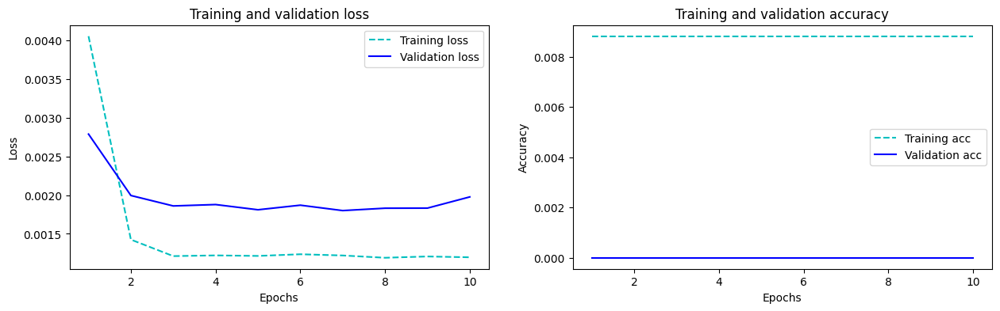

In [71]:
plot_curve(hist_1)

In [72]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.324595,0.334721
1,2021-12-16 09:11:00,0.112,0.144608,0.134506
2,2021-12-16 09:12:00,0.116,0.112641,0.138760
3,2021-12-16 09:13:00,0.112,0.118715,0.132387
4,2021-12-16 09:14:00,0.099,0.118448,0.125156
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.179032
289,2021-12-16 13:59:00,0.169,0.167558,0.179189
290,2021-12-16 14:00:00,0.147,0.168295,0.180033
291,2021-12-16 14:01:00,0.145,0.151338,0.158840


In [73]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [74]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_100)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001812
1,model_1,0.001968


In [75]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam frist layer unit 100 learning rate 0.005', lstm_mse_error_unit_100]

------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [76]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 15ms/step - loss: 0.0043 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 14ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.001478127553127706
Last validation loss: 0.002012413926422596
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


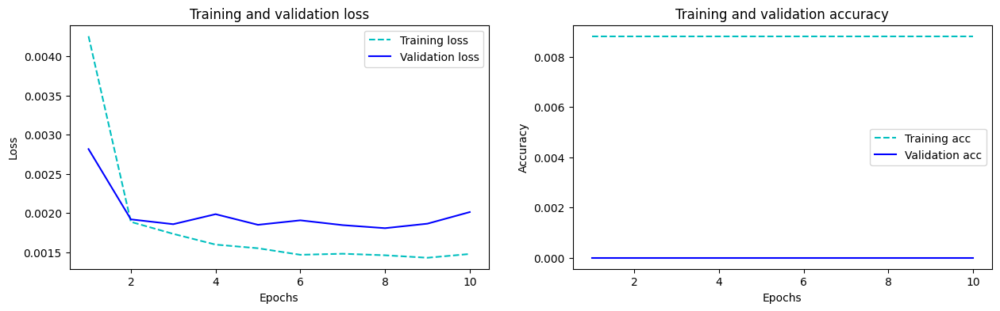

In [77]:
plot_curve(hist_2)

In [78]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.324595,0.334721,0.338046
1,2021-12-16 09:11:00,0.112,0.144608,0.134506,0.130896
2,2021-12-16 09:12:00,0.116,0.112641,0.138760,0.130328
3,2021-12-16 09:13:00,0.112,0.118715,0.132387,0.114776
4,2021-12-16 09:14:00,0.099,0.118448,0.125156,0.112430
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.179032,0.175121
289,2021-12-16 13:59:00,0.169,0.167558,0.179189,0.175305
290,2021-12-16 14:00:00,0.147,0.168295,0.180033,0.176135
291,2021-12-16 14:01:00,0.145,0.151338,0.158840,0.154057


In [79]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [80]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001812
1,model_1,0.002002


In [81]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 drop out 0.1 learning rate 0.005', lstm_mse_error_50_drop_out]

In [88]:
mse_data = mse_data.replace({'Model': {'Lstm mse error adam frist layer unit 100 drop out 0.1 learning rate 0.005' : 'Lstm mse error adam 50 drop out 0.1 learning rate 0.005'}})
mse_data

,Model,LSTM lag20
0,Lstm mse error unit 50 adam,0.001823
1,Lstm mse error unit 50 sgd,0.005080
2,Lstm mse error unit 50 rmsprop,0.001825
3,Lstm mse error adam 50 batch_size64,0.001861
4,Lstm mse error adam 50 learning rate 0.1,0.001952
5,Lstm mse error adam 50 learning rate 0.05,0.001887
6,Lstm mse error adam 50 learning rate 0.01,0.002085
7,Lstm mse error adam 50 learning rate 0.005,0.001812
8,Lstm mse error adam 50 learning rate 0.001,0.002085
9,Lstm mse error adam frist layer unit 100 learn...,0.001968


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [94]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 14s 18ms/step - loss: 0.0050 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 7s 15ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 8s 17ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 8s 16ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0012797253439202905
Last validation loss: 0.0018699343781918287
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


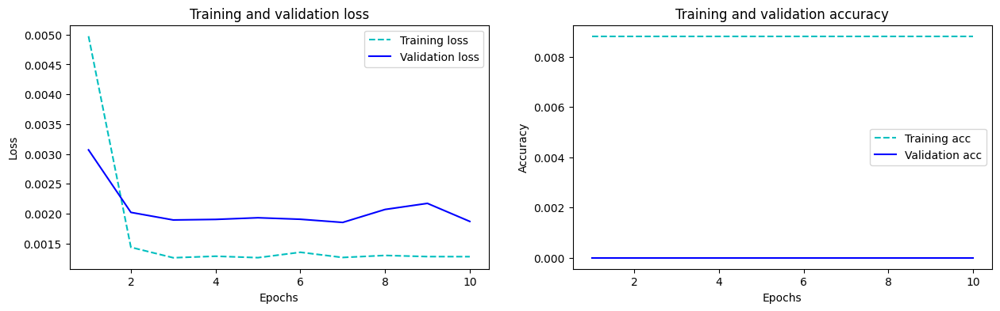

In [95]:
plot_curve(hist_3)

In [96]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 2s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.324595,0.334721,0.338046,0.332191
1,2021-12-16 09:11:00,0.112,0.144608,0.134506,0.130896,0.126893
2,2021-12-16 09:12:00,0.116,0.112641,0.138760,0.130328,0.109863
3,2021-12-16 09:13:00,0.112,0.118715,0.132387,0.114776,0.117999
4,2021-12-16 09:14:00,0.099,0.118448,0.125156,0.112430,0.115378
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.179032,0.175121,0.170727
289,2021-12-16 13:59:00,0.169,0.167558,0.179189,0.175305,0.170611
290,2021-12-16 14:00:00,0.147,0.168295,0.180033,0.176135,0.171565
291,2021-12-16 14:01:00,0.145,0.151338,0.158840,0.154057,0.150863


In [97]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [98]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_second_layer)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001812
1,model_1,0.001861


In [99]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 second layer unit 50 learning rate 0.005', lstm_mse_error_second_layer]

---

### Add frist layer: units = 50 and Add second layer: unit = 100

In [100]:
model_4 = Sequential()
model_4.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_4.add(LSTM(units = 100))
model_4.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_4.compile(optimizer = opt, loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 18s 26ms/step - loss: 0.0076 - accuracy: 0.0087 - val_loss: 0.0038 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 10s 21ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 10s 21ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 10s 21ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss

Last train loss: 0.0012235620524734259
Last validation loss: 0.001909469603560865
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


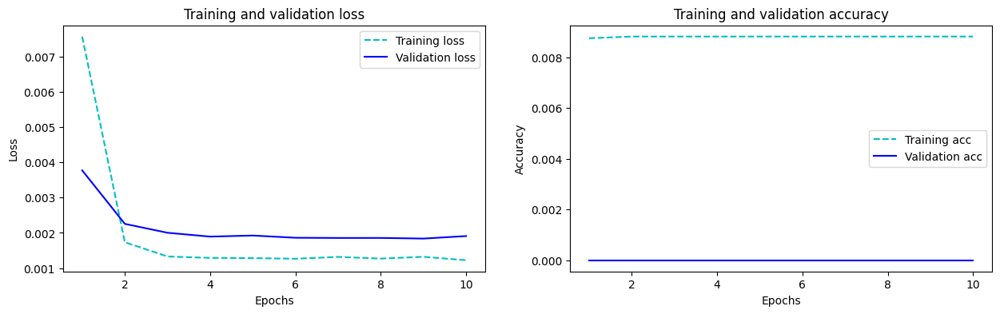

In [101]:
plot_curve(hist_4)

In [102]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_second_layer_100'] = predict_4
test3

10/10 [==============================] - 1s 9ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100
0,2021-12-16 09:10:00,0.111,0.324595,0.334721,0.338046,0.332191,0.331109
1,2021-12-16 09:11:00,0.112,0.144608,0.134506,0.130896,0.126893,0.140203
2,2021-12-16 09:12:00,0.116,0.112641,0.138760,0.130328,0.109863,0.132137
3,2021-12-16 09:13:00,0.112,0.118715,0.132387,0.114776,0.117999,0.132549
4,2021-12-16 09:14:00,0.099,0.118448,0.125156,0.112430,0.115378,0.127670
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.179032,0.175121,0.170727,0.178580
289,2021-12-16 13:59:00,0.169,0.167558,0.179189,0.175305,0.170611,0.178558
290,2021-12-16 14:00:00,0.147,0.168295,0.180033,0.176135,0.171565,0.179399
291,2021-12-16 14:01:00,0.145,0.151338,0.158840,0.154057,0.150863,0.159487


In [103]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [104]:
lstm_mse_error_second_layer_unit100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_second_layer_unit100)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001812
1,model_1,0.001900


In [105]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 second layer unit 100 learning rate 0.005', lstm_mse_error_second_layer_unit100]
mse_data

,Model,LSTM lag20
0,Lstm mse error unit 50 adam,0.001823
1,Lstm mse error unit 50 sgd,0.005080
2,Lstm mse error unit 50 rmsprop,0.001825
3,Lstm mse error adam 50 batch_size64,0.001861
4,Lstm mse error adam 50 learning rate 0.1,0.001952
5,Lstm mse error adam 50 learning rate 0.05,0.001887
6,Lstm mse error adam 50 learning rate 0.01,0.002085
7,Lstm mse error adam 50 learning rate 0.005,0.001812
8,Lstm mse error adam 50 learning rate 0.001,0.002085
9,Lstm mse error adam frist layer unit 100 learn...,0.001968


---

### Add frist layer: units = 50 and change epochs from 10 to 30

In [109]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
461/461 [==============================] - 10s 10ms/step - loss: 0.0033 - accuracy: 0.0087 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 2/30
461/461 [==============================] - 4s 9ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/30
461/461 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/30
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/30
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/30
461/461 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/30
461/461 [==============================] - 4s 9ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - v

Last train loss: 0.0011601654114201665
Last validation loss: 0.0020021353848278522
Last train accuracy: 0.008814754895865917
Last validation accuracy: 0.0


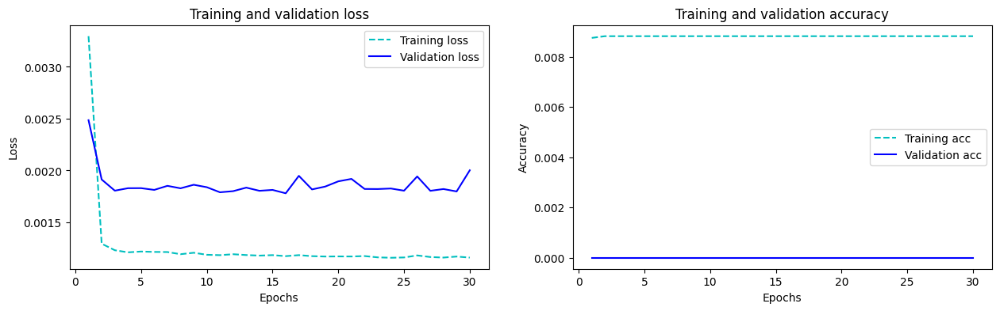

In [110]:
plot_curve(hist_5)

In [111]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch30'] = predict_5
test3

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30
0,2021-12-16 09:10:00,0.111,0.324595,0.334721,0.338046,0.332191,0.331109,0.336224
1,2021-12-16 09:11:00,0.112,0.144608,0.134506,0.130896,0.126893,0.140203,0.132344
2,2021-12-16 09:12:00,0.116,0.112641,0.138760,0.130328,0.109863,0.132137,0.130068
3,2021-12-16 09:13:00,0.112,0.118715,0.132387,0.114776,0.117999,0.132549,0.134166
4,2021-12-16 09:14:00,0.099,0.118448,0.125156,0.112430,0.115378,0.127670,0.129423
...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167951,0.179032,0.175121,0.170727,0.178580,0.181430
289,2021-12-16 13:59:00,0.169,0.167558,0.179189,0.175305,0.170611,0.178558,0.181458
290,2021-12-16 14:00:00,0.147,0.168295,0.180033,0.176135,0.171565,0.179399,0.182394
291,2021-12-16 14:01:00,0.145,0.151338,0.158840,0.154057,0.150863,0.159487,0.161392


In [112]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [113]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_50_epoch30)

Better MSE value is :  0.0018120913967518348


,Model,MSE error
0,model,0.001812
1,model_1,0.001992


---

In [114]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 epoch 30 learning rate 0.005', lstm_mse_error_unit_50_epoch30]

In [115]:
mse_data

,Model,LSTM lag20
0,Lstm mse error unit 50 adam,0.001823
1,Lstm mse error unit 50 sgd,0.005080
2,Lstm mse error unit 50 rmsprop,0.001825
3,Lstm mse error adam 50 batch_size64,0.001861
4,Lstm mse error adam 50 learning rate 0.1,0.001952
5,Lstm mse error adam 50 learning rate 0.05,0.001887
6,Lstm mse error adam 50 learning rate 0.01,0.002085
7,Lstm mse error adam 50 learning rate 0.005,0.001812
8,Lstm mse error adam 50 learning rate 0.001,0.002085
9,Lstm mse error adam frist layer unit 100 learn...,0.001968


In [116]:
minimum_mse= mse_data.loc[mse_data['LSTM lag20'].idxmin()]
minimum_mse

Model         Lstm mse error adam 50 learning rate 0.005
LSTM lag20                                      0.001812
Name: 7, dtype: object

In [119]:
data_mse = pd.read_csv('data_lstm_mse.csv')
data_mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882,0.001867
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799


In [120]:
mse = pd.merge(data_mse,mse_data, on = 'Model', how='outer')
mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882,0.001867,0.001825
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN


In [ ]:
mse.dtypes

In [121]:
# mse["LSTM lag1", "LSTM lag5"] = pd.to_numeric(mse["LSTM lag1", "LSTM lag5"])
minimum_mse1= mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15','LSTM lag20']].idxmin()
minimum_mse1

LSTM lag1      0
LSTM lag5     17
LSTM lag10     5
LSTM lag15     9
LSTM lag20     7
dtype: int64

In [122]:
minimum_mse1= mse.loc[mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15','LSTM lag20']].idxmin()]
minimum_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823
17,Lstm mse error adam 100 second layer unit 100,NaN,0.001801,NaN,0.001830,NaN
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812


In [123]:
mse.to_csv('data_lstm_mse.csv',index=False)

In [124]:
model_0005.save('model_lag20.h5')